# Milestone 1/2

## **Cel biznesowy:** Segmentacja klientów banku na podstawie ich zachowań transakcyjnych i typów kont w celu personalizacji ofert marketingowych i zwiększenia retencji klientów

**Korzyści wynikające dla banku z racji takiego pogrupowania klientów:**

- Możliwość kierowania odpowiednich ofert do odpowiednich klientów (np. lokaty dla klientów z dużym saldem).

- Identyfikacja klientów wysokiego ryzyka lub niskiej aktywności.

- Możliwość tworzenia kampanii retencyjnych dla segmentów o niskim zaangażowaniu.

## Eksploracja i wstępna analiza danych

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

df = pd.read_csv("data/banking_dataset.csv", sep=";")

In [3]:
df.head()

,Account ID,Customer Name,Account Type,Branch,Transaction Type,Transaction Amount,Account Balance,Currency
0,ACC00001,Amanda Pugh,Recurring Deposit,New York,Debit,"2687,19","36676,19",GBP
1,ACC00002,Amanda Wilcox,Recurring Deposit,Houston,Debit,"3886,77","28582,82",USD
2,ACC00003,Kimberly Valenzuela,Current,New York,Credit,"2438,74","76599,56",GBP
3,ACC00004,Sonia Ballard,Recurring Deposit,Philadelphia,Credit,"2758,53","62317,6",INR
4,ACC00005,Erika Russell,Current,Philadelphia,Debit,3287,"85515,21",INR


In [4]:
df.tail()

,Account ID,Customer Name,Account Type,Branch,Transaction Type,Transaction Amount,Account Balance,Currency
9995,ACC09996,Richard Davis,Fixed Deposit,New York,Debit,"400,96","38035,17",USD
9996,ACC09997,Lauren Weber,Savings,Chicago,Debit,"3736,7","60682,41",EUR
9997,ACC09998,Nichole Stout,Fixed Deposit,Houston,Credit,"4002,91","36136,11",USD
9998,ACC09999,Kristen Wilkinson,Fixed Deposit,Philadelphia,Debit,"866,9","35644,82",GBP
9999,ACC10000,Brian Sandoval,Fixed Deposit,Philadelphia,Debit,"3932,81","32357,51",GBP


In [5]:
df.shape

(10000, 8)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Account ID          10000 non-null  object
 1   Customer Name       10000 non-null  object
 2   Account Type        10000 non-null  object
 3   Branch              10000 non-null  object
 4   Transaction Type    10000 non-null  object
 5   Transaction Amount  10000 non-null  object
 6   Account Balance     10000 non-null  object
 7   Currency            10000 non-null  object
dtypes: object(8)
memory usage: 625.1+ KB


In [7]:
print(df.isnull().sum())

Account ID            0
Customer Name         0
Account Type          0
Branch                0
Transaction Type      0
Transaction Amount    0
Account Balance       0
Currency              0
dtype: int64


Brak pustych wartości

In [8]:
df.describe()

,Account ID,Customer Name,Account Type,Branch,Transaction Type,Transaction Amount,Account Balance,Currency
count,10000,10000,10000,10000,10000,10000,10000,10000
unique,10000,9323,4,8,2,9896,9995,5
top,ACC09984,William Williams,Savings,Philadelphia,Credit,"3398,97","21317,69",JPY
freq,1,7,2580,1288,5114,3,2,2041


Po wstępnej analizie kolumn, usunięte zostaną kolumny 'Account ID' oraz 'Customer Name', są to informacje, które nie wnoszą żadnej informacji

In [17]:
df = df.drop(['Account ID', 'Customer Name'], axis = 1)

In [10]:
df.head()

,Account Type,Branch,Transaction Type,Transaction Amount,Account Balance,Currency
0,Recurring Deposit,New York,Debit,"2687,19","36676,19",GBP
1,Recurring Deposit,Houston,Debit,"3886,77","28582,82",USD
2,Current,New York,Credit,"2438,74","76599,56",GBP
3,Recurring Deposit,Philadelphia,Credit,"2758,53","62317,6",INR
4,Current,Philadelphia,Debit,3287,"85515,21",INR


In [18]:
df['Transaction Amount'] = df['Transaction Amount'].str.replace(',', '.').astype(float)
df['Account Balance'] = df['Account Balance'].str.replace(',', '.').astype(float)

In [12]:
print(df.dtypes)

Account Type           object
Branch                 object
Transaction Type       object
Transaction Amount    float64
Account Balance       float64
Currency               object
dtype: object


In [13]:
for col in ['Account Type', 'Branch', 'Transaction Type', 'Currency']:
    print(f"\nUnikalne wartości w kolumnie {col}:")
    print(df[col].value_counts())


Unikalne wartości w kolumnie Account Type:
Account Type
Savings              2580
Current              2529
Fixed Deposit        2489
Recurring Deposit    2402
Name: count, dtype: int64

Unikalne wartości w kolumnie Branch:
Branch
Philadelphia    1288
Phoenix         1274
Los Angeles     1268
Houston         1259
New York        1256
Chicago         1239
San Antonio     1233
San Diego       1183
Name: count, dtype: int64

Unikalne wartości w kolumnie Transaction Type:
Transaction Type
Credit    5114
Debit     4886
Name: count, dtype: int64

Unikalne wartości w kolumnie Currency:
Currency
JPY    2041
EUR    2039
USD    2035
GBP    1958
INR    1927
Name: count, dtype: int64


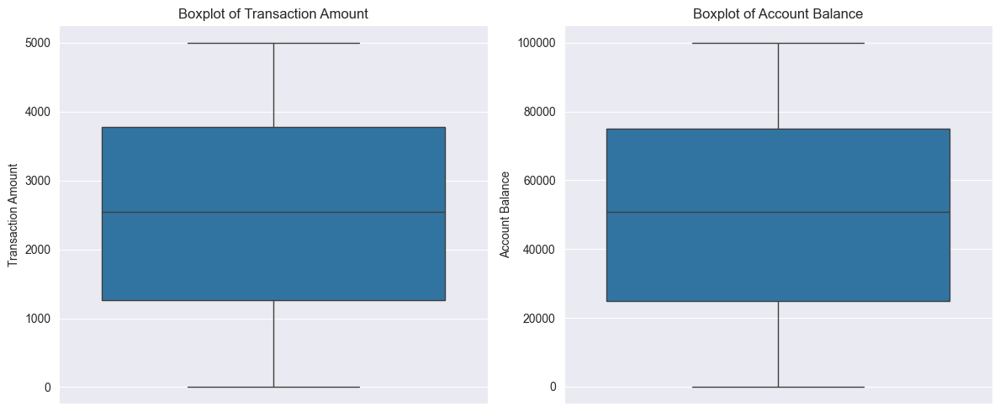

In [14]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(y=df['Transaction Amount'])
plt.title('Boxplot of Transaction Amount')
plt.subplot(1, 2, 2)
sns.boxplot(y=df['Account Balance'])
plt.title('Boxplot of Account Balance')
plt.tight_layout()
plt.show()

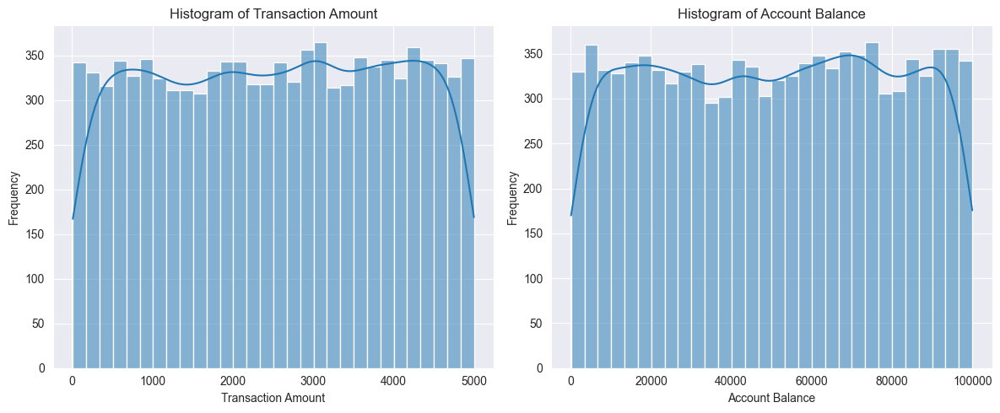

In [15]:
plt.figure(figsize=(12, 5))

# Transaction amount
plt.subplot(1, 2, 1)
sns.histplot(df['Transaction Amount'], bins=30, kde=True)
plt.title('Histogram of Transaction Amount')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')

# Acc balance
plt.subplot(1, 2, 2)
sns.histplot(df['Account Balance'], bins=30, kde=True)
plt.title('Histogram of Account Balance')
plt.xlabel('Account Balance')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

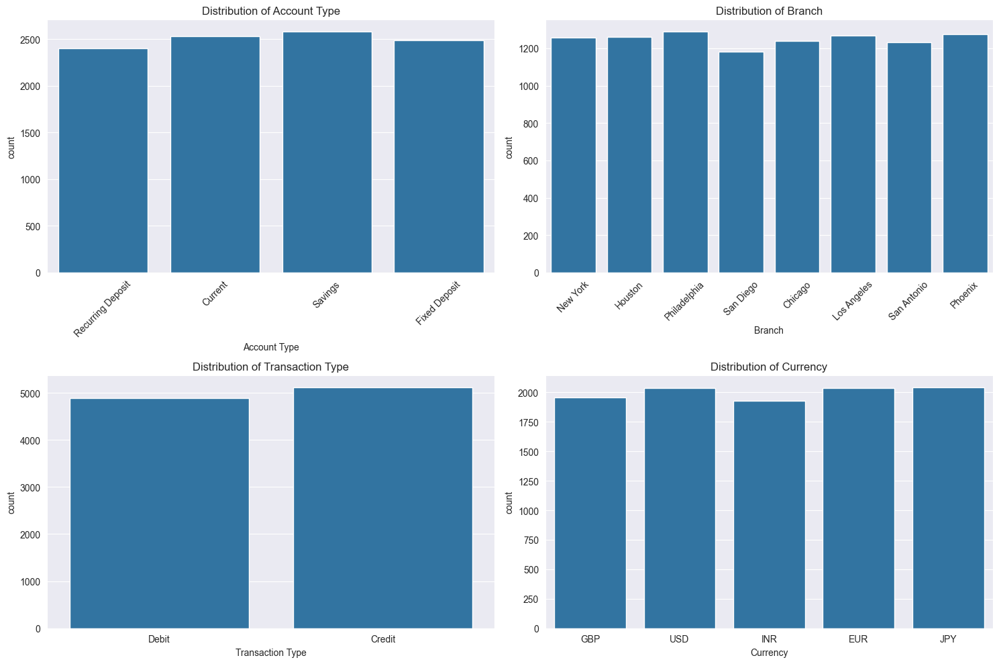

In [16]:
plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
sns.countplot(x='Account Type', data=df)
plt.title('Distribution of Account Type')
plt.xticks(rotation=45)

plt.subplot(2, 2, 2)
sns.countplot(x='Branch', data=df)
plt.title('Distribution of Branch')
plt.xticks(rotation=45)

plt.subplot(2, 2, 3)
sns.countplot(x='Transaction Type', data=df)
plt.title('Distribution of Transaction Type')

plt.subplot(2, 2, 4)
sns.countplot(x='Currency', data=df)
plt.title('Distribution of Currency')
plt.tight_layout()
plt.show()

Dla każdej zmiennej kategorycznej zliczenia możliwych wartości są rozłożone mniej więcej po równo.

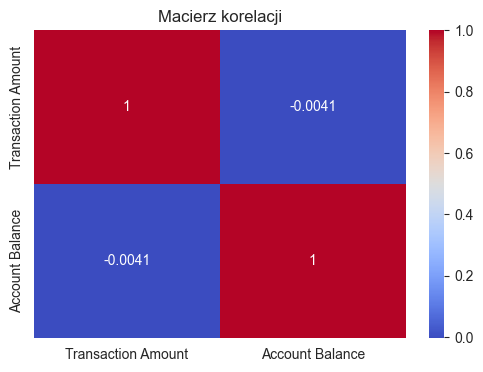

In [17]:
plt.figure(figsize=(6, 4))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title("Macierz korelacji")
plt.show()

In [18]:
print(df.groupby('Account Type')['Transaction Amount'].mean())

print(df.groupby('Currency')['Account Balance'].mean())

Account Type
Current              2502.820059
Fixed Deposit        2546.617151
Recurring Deposit    2512.312627
Savings              2536.010089
Name: Transaction Amount, dtype: float64
Currency
EUR    50502.715473
GBP    49906.100516
INR    51049.621271
JPY    49827.480314
USD    50091.525027
Name: Account Balance, dtype: float64


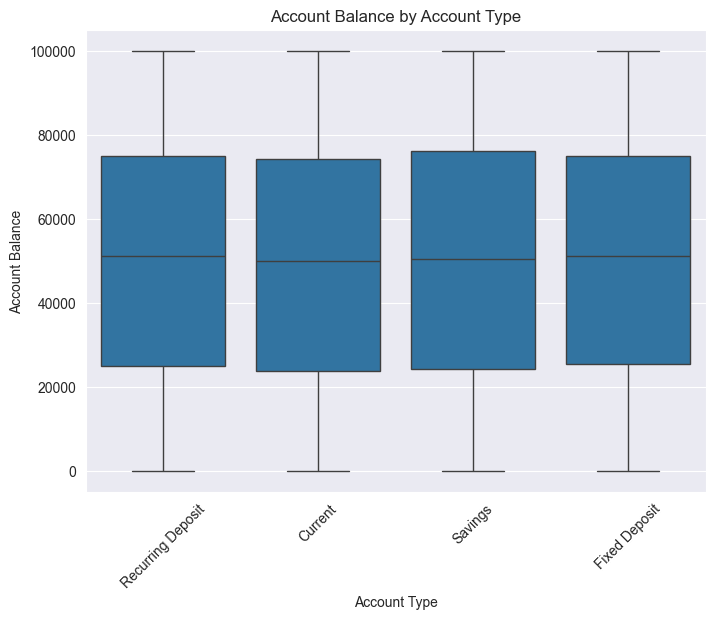

In [19]:
plt.figure(figsize=(8, 6))
sns.boxplot(x='Account Type', y='Account Balance', data=df)
plt.title('Account Balance by Account Type')
plt.xticks(rotation=45)
plt.show()

In [20]:
print(pd.crosstab(df['Account Type'], df['Transaction Type']))

Transaction Type   Credit  Debit
Account Type                    
Current              1323   1206
Fixed Deposit        1266   1223
Recurring Deposit    1206   1196
Savings              1319   1261


In [21]:
df_original = pd.read_csv("data/banking_dataset.csv", sep=";")

In [22]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

df_original['Transaction Type'] = le.fit_transform(df_original['Transaction Type'])
df_original['Account Type'] = le.fit_transform(df_original['Account Type'])
df_original['Branch'] = le.fit_transform(df_original['Branch'])
df_original['Currency'] = le.fit_transform(df_original['Currency'])

df_original['Transaction Amount'] = df_original['Transaction Amount'].str.replace(',', '.').astype(float)
df_original['Account Balance'] = df_original['Account Balance'].str.replace(',', '.').astype(float)

df_original = df_original.drop(['Account ID', 'Customer Name'], axis = 1)

Text(0.5, 1.0, 'Transaction Amount vs Account Balance (Currency)')

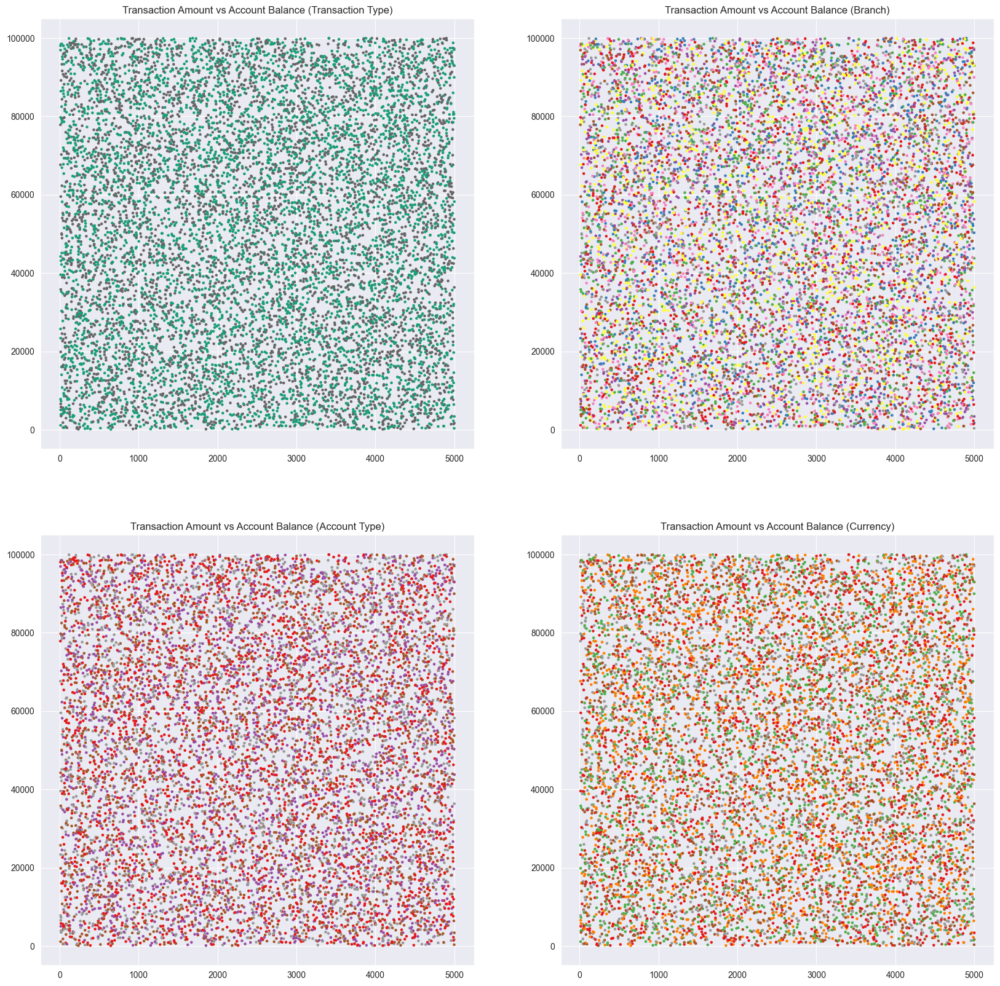

In [39]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

axes[0,0].scatter(df['Transaction Amount'], df['Account Balance'], c=df_original['Transaction Type'], s=5, cmap='Dark2')
axes[0,0].set_title('Transaction Amount vs Account Balance (Transaction Type)')

axes[1,0].scatter(df['Transaction Amount'], df['Account Balance'], c=df_original['Account Type'], s=5, cmap='Set1')
axes[1,0].set_title('Transaction Amount vs Account Balance (Account Type)')

axes[0,1].scatter(df['Transaction Amount'], df['Account Balance'], c=df_original['Branch'], s=5, cmap='Set1')
axes[0,1].set_title('Transaction Amount vs Account Balance (Branch)')

axes[1,1].scatter(df['Transaction Amount'], df['Account Balance'], c=df_original['Currency'], s=5, cmap='Set1')
axes[1,1].set_title('Transaction Amount vs Account Balance (Currency)')

Ciężko doszukiwać się jakichś relacji

# **Inżynieria cech**

W tej części projektu skupimy się na utworzeniu nowych zmiennych tak, aby mogły one pogrupować danych klientów w odpowiednie grupy.

## **Zamiana na jedną walutę i ponowne przeprowadzenie analizy**

In [19]:
exchange_rates = {'USD': 1.0, 'EUR': 1.08, 'GBP': 1.27, 'INR': 0.012, 'JPY': 0.0066}

# Zamiana na USD
df['Transaction Amount USD'] = df.apply(lambda x: float(x['Transaction Amount']) * exchange_rates.get(x['Currency'], 1.0), axis=1)
df['Account Balance USD'] = df.apply(lambda x: float(x['Account Balance']) * exchange_rates.get(x['Currency'], 1.0), axis=1)

# sprawdzamy czy dizała
print(df[['Transaction Amount USD', 'Account Balance USD']].describe())

       Transaction Amount USD  Account Balance USD
count            10000.000000         10000.000000
mean              1704.556596         33910.047464
std               1870.159242         37213.913721
min                  0.082434             0.897336
25%                 26.736683           535.726967
50%                950.329000         18802.265000
75%               3277.854375         65177.548200
max               6347.510800        126968.999300


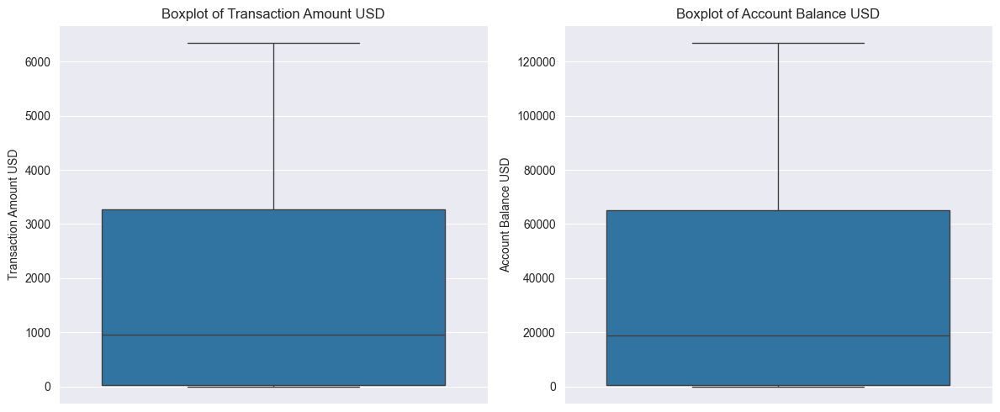

In [41]:
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.boxplot(y=df['Transaction Amount USD'])
plt.title('Boxplot of Transaction Amount USD')
plt.subplot(1, 2, 2)
sns.boxplot(y=df['Account Balance USD'])
plt.title('Boxplot of Account Balance USD')
plt.tight_layout()
plt.show()

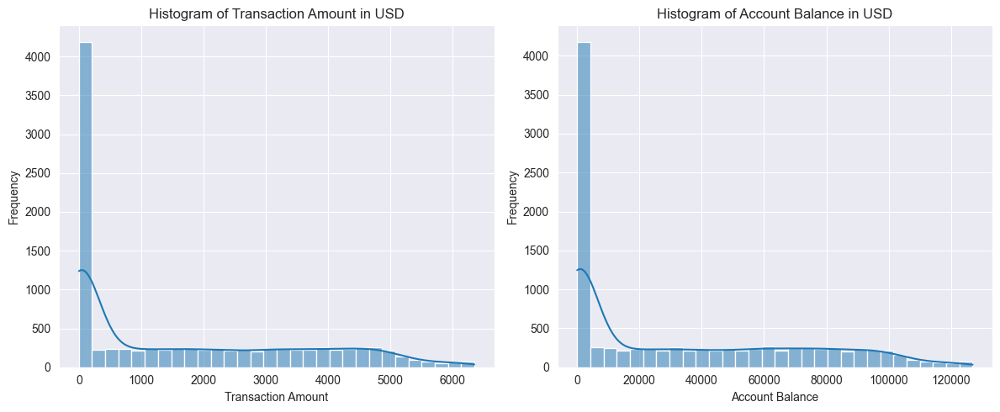

In [42]:
plt.figure(figsize=(12, 5))

# Histogram dla Transaction Amount
plt.subplot(1, 2, 1)
sns.histplot(df['Transaction Amount USD'], bins=30, kde=True)
plt.title('Histogram of Transaction Amount in USD')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')

# Histogram dla Account Balance
plt.subplot(1, 2, 2)
sns.histplot(df['Account Balance USD'], bins=30, kde=True)
plt.title('Histogram of Account Balance in USD')
plt.xlabel('Account Balance')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

Bardzo mocna skośność, sprwadźmy jak prezentują się wykresy z wartością zlogarytmowaną.

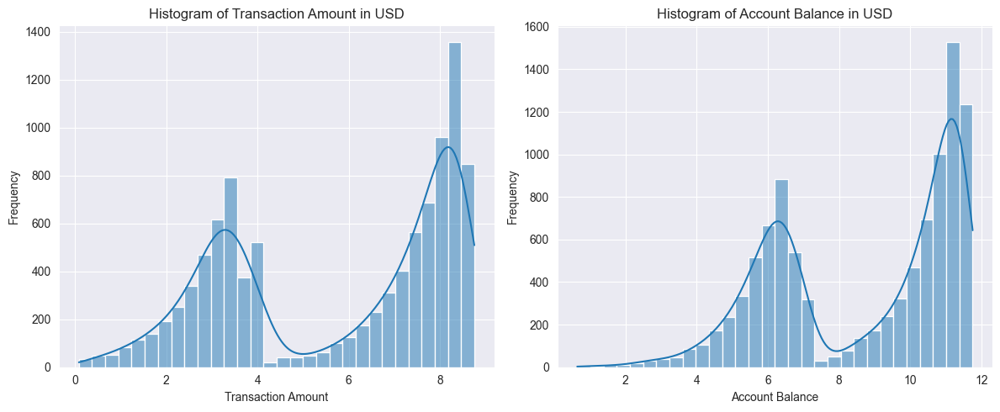

In [43]:
plt.figure(figsize=(12, 5))

# Histogram dla Transaction Amount
plt.subplot(1, 2, 1)
sns.histplot(x=np.log1p(df['Transaction Amount USD']), bins=30, kde=True)
plt.title('Histogram of Transaction Amount in USD')
plt.xlabel('Transaction Amount')
plt.ylabel('Frequency')

# Histogram dla Account Balance
plt.subplot(1, 2, 2)
sns.histplot(x=np.log1p(df['Account Balance USD']), bins=30, kde=True)
plt.title('Histogram of Account Balance in USD')
plt.xlabel('Account Balance')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [20]:
df['Transaction Amount USD log'] = np.log1p(df['Transaction Amount USD'])
df['Account Balance USD log'] = np.log1p(df['Account Balance USD'])

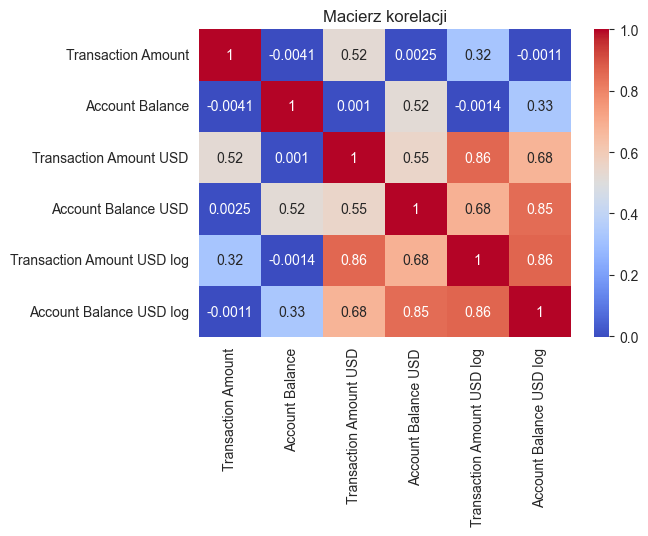

In [21]:
plt.figure(figsize=(6, 4))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm')
plt.title("Macierz korelacji")
plt.show()

Zmienienie waluty na jedną sprawia, że kolumny odpowiadające za stan konta oraz wartość transakcji są mocniej skorelowane, a po zlogarytmowaniu ich ta korelacja jest już na prawdę bardzo wysoka. Prawdopodobnie lepiej jest zostać przy oryginalnej wartości Transaction Amount oraz Account Balance, ale brać pod uwagę kolumnę Currency, która będzie nam mówić o walucie.

In [22]:
df = df.drop(['Transaction Amount USD', 'Account Balance USD', 'Transaction Amount USD log', 'Account Balance USD log'], axis = 1)

In [23]:
print(df.columns)

Index(['Account Type', 'Branch', 'Transaction Type', 'Transaction Amount',
       'Account Balance', 'Currency'],
      dtype='object')


In [24]:
df = pd.get_dummies(df, columns=['Currency'], prefix='Currency')

In [50]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

features = ['Transaction Amount', 'Account Balance'] + list(df.filter(like='Currency_').columns)

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

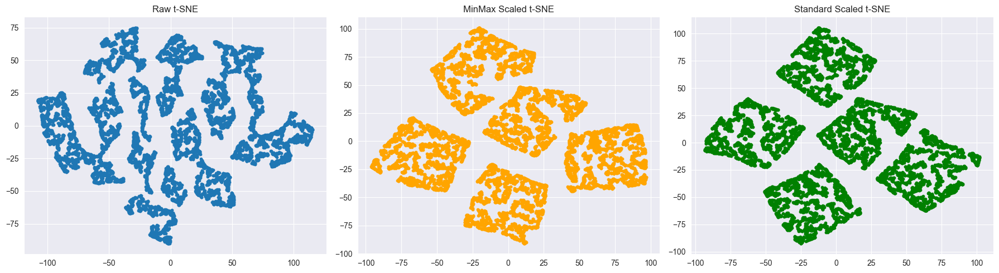

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [54]:
from sklearn.cluster import DBSCAN

dbsc_Xraw = DBSCAN(n_jobs=-1).fit_predict(X)
dbsc_Xminmax = DBSCAN(n_jobs=-1).fit_predict(MinMaxScaler().fit_transform(X))
dbsc_Xstandard = DBSCAN(n_jobs=-1).fit_predict(StandardScaler().fit_transform(X))

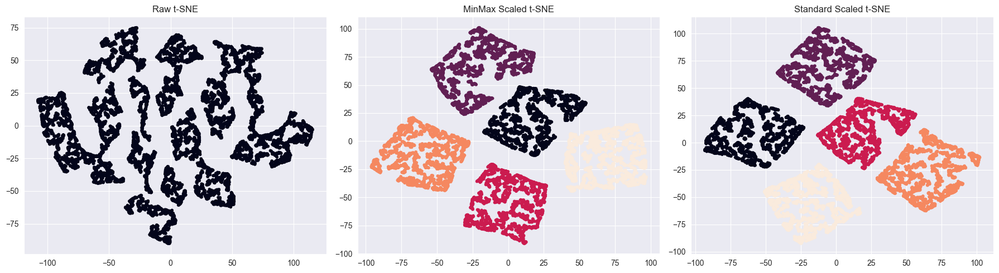

In [55]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10, c=dbsc_Xraw)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=dbsc_Xminmax)
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c=dbsc_Xstandard)
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

Teraz bez kolumn Currency

In [56]:
features = ['Transaction Amount', 'Account Balance', 'Activity_Ratio'] #+ list(df.filter(like='Currency_').columns)

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

In [69]:
from sklearn.cluster import DBSCAN

dbsc_Xraw = DBSCAN().fit_predict(X)
dbsc_Xminmax = DBSCAN().fit_predict(MinMaxScaler().fit_transform(X))
dbsc_Xstandard = DBSCAN().fit_predict(StandardScaler().fit_transform(X))

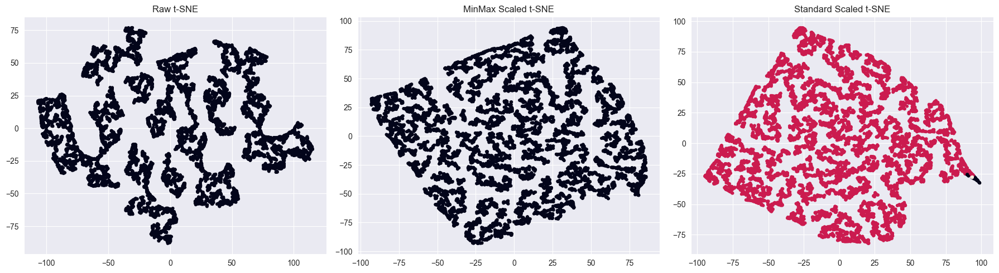

In [70]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10, c=dbsc_Xraw)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=dbsc_Xminmax)
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c=dbsc_Xstandard)
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [25]:
df['Activity_Ratio'] = df['Account Balance'] / (df['Transaction Amount'] + 1)

In [80]:
features = ['Transaction Amount', 'Account Balance', 'Activity_Ratio'] #+ list(df.filter(like='Currency_').columns)

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

In [81]:
from sklearn.cluster import AgglomerativeClustering

agg_raw = AgglomerativeClustering(n_clusters=5).fit_predict(X)
agg_minmax = AgglomerativeClustering(n_clusters=5).fit_predict(X_minmax)
agg_standard = AgglomerativeClustering(n_clusters=5).fit_predict(X_standard)

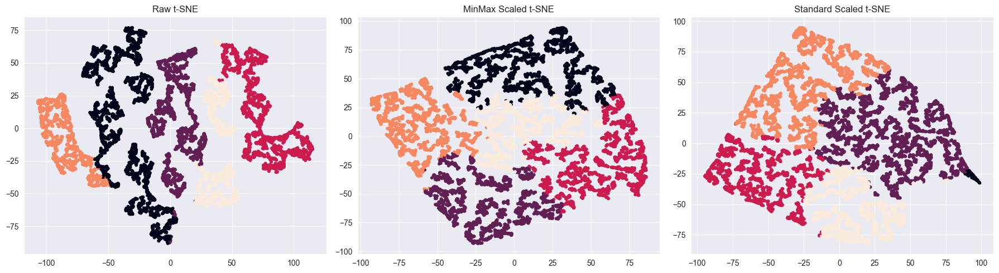

In [83]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10, c=agg_raw)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=agg_minmax)
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c=agg_standard)
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [76]:
features = ['Activity_Ratio'] + list(df.filter(like='Currency_').columns)

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

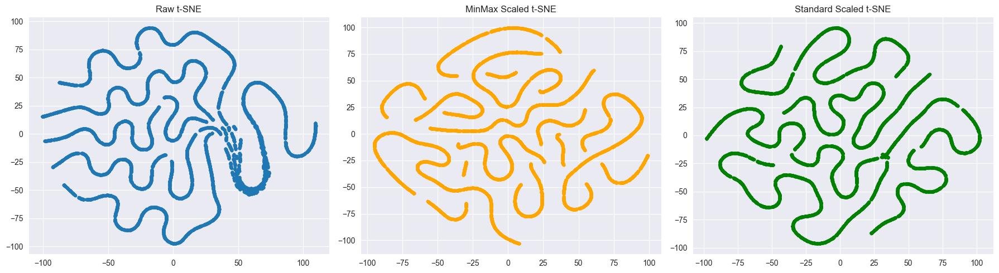

In [77]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [78]:
from sklearn.cluster import AgglomerativeClustering

agg_raw = AgglomerativeClustering(n_clusters=5).fit_predict(X)
agg_minmax = AgglomerativeClustering(n_clusters=5).fit_predict(X_minmax)
agg_standard = AgglomerativeClustering(n_clusters=5).fit_predict(X_standard)

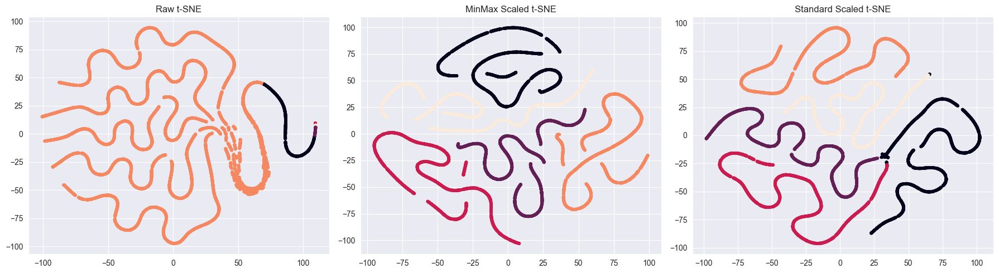

In [79]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10, c=agg_raw)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=agg_minmax)
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c=agg_standard)
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [26]:
df['Account_Type_Original'] = df['Account Type'].copy()
df = pd.get_dummies(df, columns=['Account Type'], prefix='Account_Type')
df['Account_Balance_Relative_to_Mean_AccType'] = df['Account Balance'] / df.groupby('Account_Type_Original')['Account Balance'].transform('mean')
df = df.drop('Account_Type_Original', axis=1)

Zmienna mówiąca o tym, czy ktoś o danym typie konta ma większy czy mniejszy stan konta

In [27]:
df['Transaction_Type_Original'] = df['Transaction Type'].copy()
df = pd.get_dummies(df, columns=['Transaction Type'], prefix='Transaction_Type')
df['Transaction_Amount_Relative_to_Mean_TransType'] = df['Transaction Amount'] / df.groupby('Transaction_Type_Original')['Transaction Amount'].transform('mean')
df = df.drop('Transaction_Type_Original', axis=1)

Zmienna mówiąca o tym czy dana transakcja była większa czy mniejsza od średniej transakcji w zależności od typu transakcji

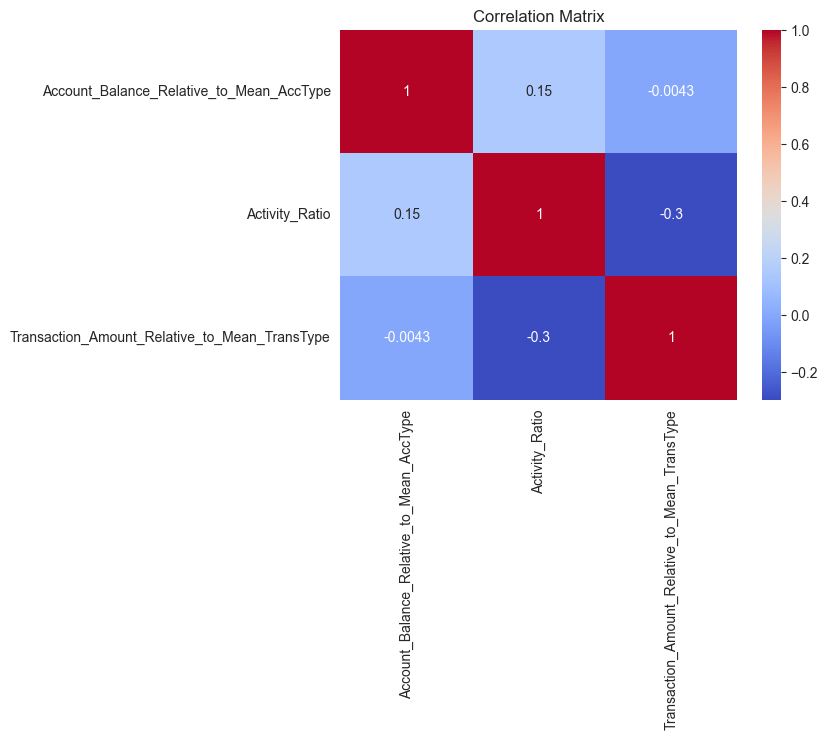

In [28]:
correlation_matrix = df[['Account_Balance_Relative_to_Mean_AccType', 'Activity_Ratio', 'Transaction_Amount_Relative_to_Mean_TransType']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [89]:
features = ['Activity_Ratio', 'Account_Balance_Relative_to_Mean_AccType', 'Transaction_Amount_Relative_to_Mean_TransType']

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

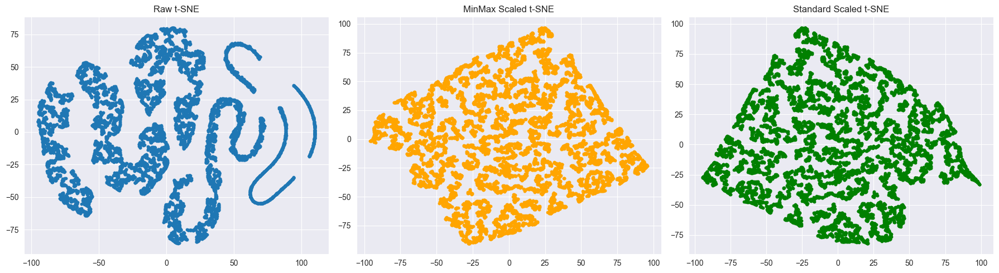

In [90]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [30]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

features = ['Activity_Ratio', 'Account_Balance_Relative_to_Mean_AccType', 'Transaction_Amount_Relative_to_Mean_TransType'] + list(df.filter(like='Currency_').columns)

df1 = df[features]

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

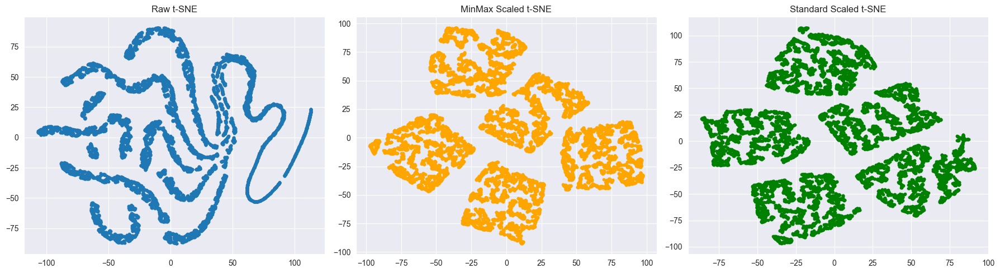

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [1]:
import umap

umap_model = umap.UMAP(n_components=4, random_state=42, n_neighbors=15, min_dist=0.1)
X_umap = umap_model.fit_transform(X_minmax)

plt.scatter(X_umap[:, 0], X_umap[:, 1], s=10)
plt.title('UMAP Visualization')
plt.show()

C:\Users\Wojtek\Documents\ML\klasteryzacja\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


NameError: name 'X_minmax' is not defined

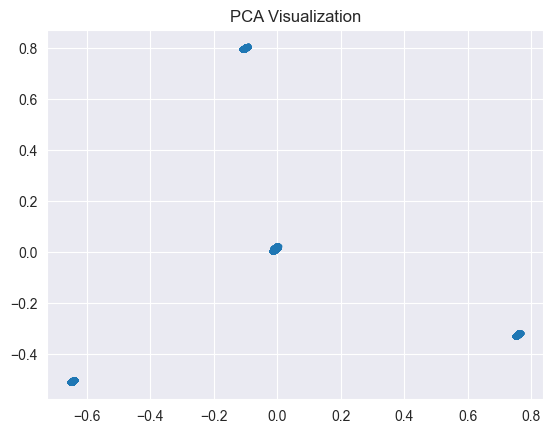

Wyjaśniona wariancja: [0.21085702 0.21048692]


In [33]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_minmax)
plt.scatter(X_pca[:, 0], X_pca[:, 1], s=10)
plt.title('PCA Visualization')
plt.show()
print("Wyjaśniona wariancja:", pca.explained_variance_ratio_)

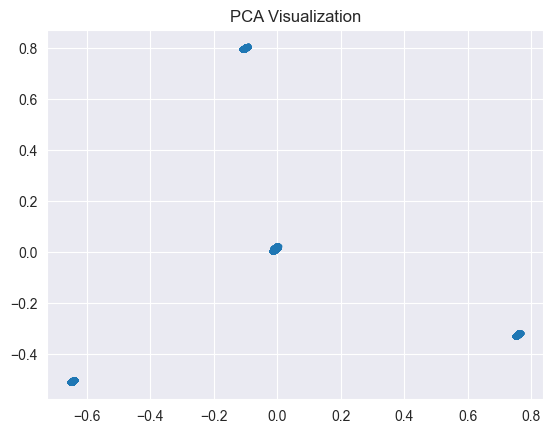

Wyjaśniona wariancja: [0.21085702 0.21048692 0.20497842 0.20040394]


In [34]:
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_minmax)
plt.scatter(X_pca[:, 0], X_pca[:, 1], s=10)
plt.title('PCA Visualization')
plt.show()
print("Wyjaśniona wariancja:", pca.explained_variance_ratio_)

In [35]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_minmax)
kmeans_pca = KMeans(n_clusters=4, random_state=42)
clusters_pca = kmeans_pca.fit_predict(X_pca)
print("Silhouette Score (PCA):", silhouette_score(X_pca, clusters_pca))

# UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)
X_umap = umap_model.fit_transform(X_minmax)
kmeans_umap = KMeans(n_clusters=5, random_state=42)
clusters_umap = kmeans_umap.fit_predict(X_umap)
print("Silhouette Score (UMAP):", silhouette_score(X_umap, clusters_umap))

Silhouette Score (PCA): 0.9919990073628171


AttributeError: module 'umap' has no attribute 'UMAP'

## Walka ze zmiennymi kategorycznymi

In [91]:
df = pd.read_csv("data/banking_dataset.csv", sep=";")

In [93]:
df['Transaction Amount'] = df['Transaction Amount'].str.replace(',', '.').astype(float)
df['Account Balance'] = df['Account Balance'].str.replace(',', '.').astype(float)
df = df.drop(['Account ID', 'Customer Name'], axis = 1)

df.head()

,Account Type,Branch,Transaction Type,Transaction Amount,Account Balance,Currency
0,Recurring Deposit,New York,Debit,2687.19,36676.19,GBP
1,Recurring Deposit,Houston,Debit,3886.77,28582.82,USD
2,Current,New York,Credit,2438.74,76599.56,GBP
3,Recurring Deposit,Philadelphia,Credit,2758.53,62317.60,INR
4,Current,Philadelphia,Debit,3287.00,85515.21,INR


One-hot encoding

In [94]:
df = pd.get_dummies(df, columns=['Branch', 'Transaction Type', 'Currency', 'Account Type'])

In [95]:
df.shape

(10000, 21)

In [98]:
from sklearn.preprocessing import LabelEncoder

df_original = pd.read_csv("data/banking_dataset.csv", sep=";")

le = LabelEncoder()

df_original['Transaction Type'] = le.fit_transform(df_original['Transaction Type'])
df_original['Account Type'] = le.fit_transform(df_original['Account Type'])
df_original['Branch'] = le.fit_transform(df_original['Branch'])
df_original['Currency'] = le.fit_transform(df_original['Currency'])

df_original['Transaction Amount'] = df_original['Transaction Amount'].str.replace(',', '.').astype(float)
df_original['Account Balance'] = df_original['Account Balance'].str.replace(',', '.').astype(float)

df_original = df_original.drop(['Account ID', 'Customer Name'], axis = 1)

In [96]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df1 = df.copy()

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

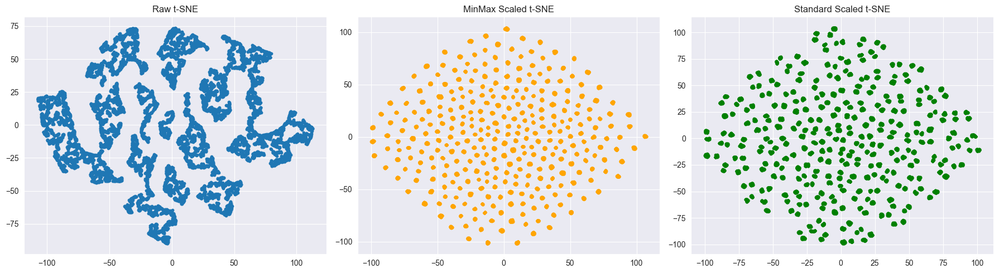

In [97]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Scatter t-SNE (Currency)')

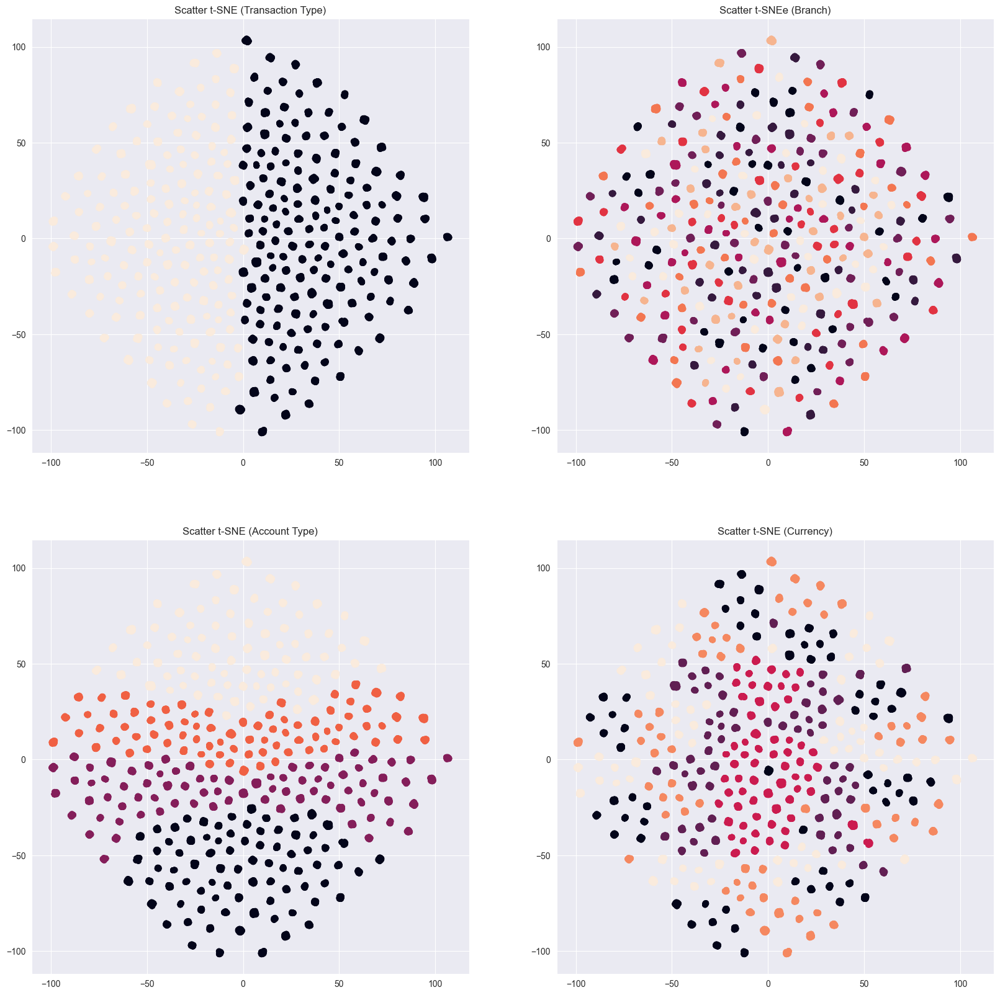

In [99]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

axes[0,0].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Transaction Type'])
axes[0,0].set_title('Scatter t-SNE (Transaction Type)')

axes[1,0].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Account Type'])
axes[1,0].set_title('Scatter t-SNE (Account Type)')

axes[0,1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Branch'])
axes[0,1].set_title('Scatter t-SNEe (Branch)')

axes[1,1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Currency'])
axes[1,1].set_title('Scatter t-SNE (Currency)')

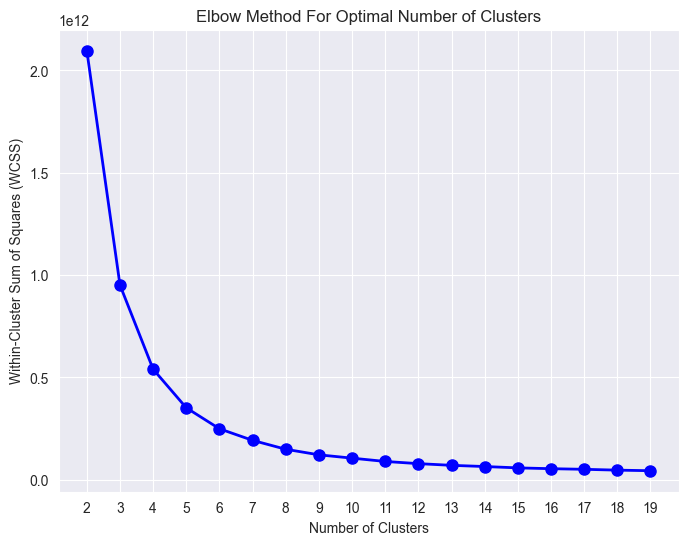

In [100]:
from sklearn.cluster import KMeans

range_n_clusters = range(2, 20)

wcss = []

for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, wcss, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

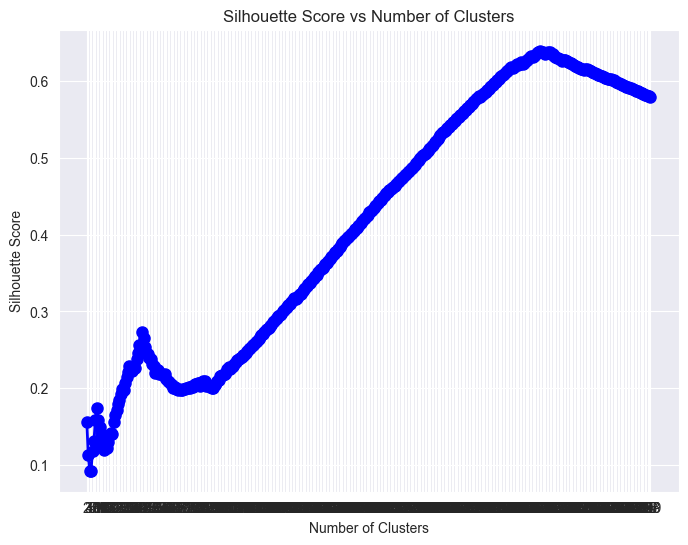

In [102]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

range_n_clusters = range(2, 400)

silhouette_scores = []

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X_minmax)
    silhouette_avg = silhouette_score(X_minmax, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

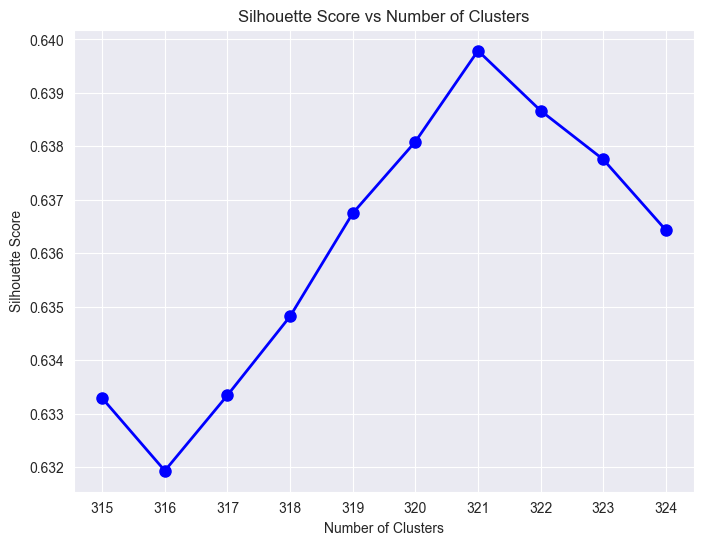

In [103]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

range_n_clusters = range(315, 325)

silhouette_scores = []

for n_clusters in range_n_clusters:
    clusterer = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = clusterer.fit_predict(X_minmax)
    silhouette_avg = silhouette_score(X_minmax, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the silhouette scores
plt.figure(figsize=(8, 6))
plt.plot(range_n_clusters, silhouette_scores, 'bo-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(range_n_clusters)
plt.grid(True)
plt.show()

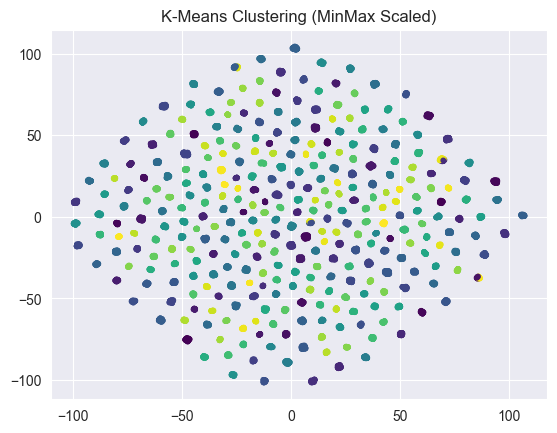

In [106]:
kmeans2 = KMeans(n_clusters=321, random_state=42).fit_predict(X_minmax)

plt.scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=kmeans2, cmap=plt.get_cmap('viridis'))
plt.title('K-Means Clustering (MinMax Scaled)')
plt.show()

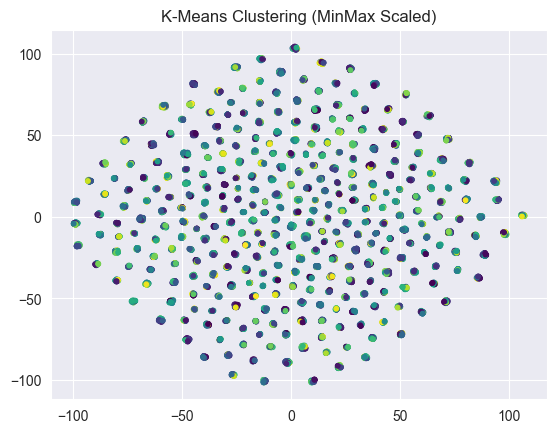

In [109]:
agglomerative = AgglomerativeClustering(n_clusters=None, distance_threshold=.5).fit_predict(X_minmax)

plt.scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=agglomerative, cmap=plt.get_cmap('viridis'))
plt.title('K-Means Clustering (MinMax Scaled)')
plt.show()

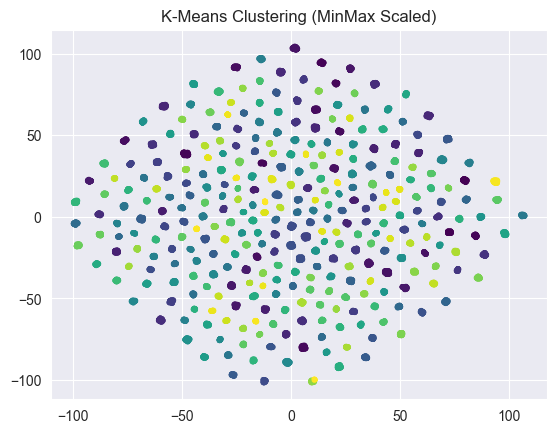

In [110]:
agglomerative2 = AgglomerativeClustering(n_clusters=321).fit_predict(X_minmax)

plt.scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=agglomerative2, cmap=plt.get_cmap('viridis'))
plt.title('K-Means Clustering (MinMax Scaled)')
plt.show()

### Label Encoder

In [111]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df1 = df_original.copy()

X = df1.values

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

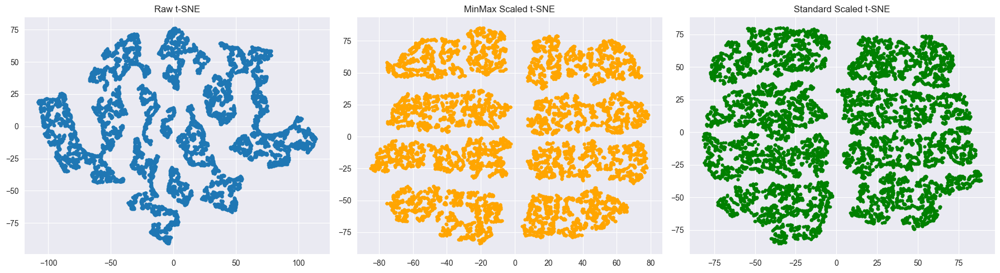

In [112]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10)
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c='orange')
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10, c='green')
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Scatter t-SNE (Currency)')

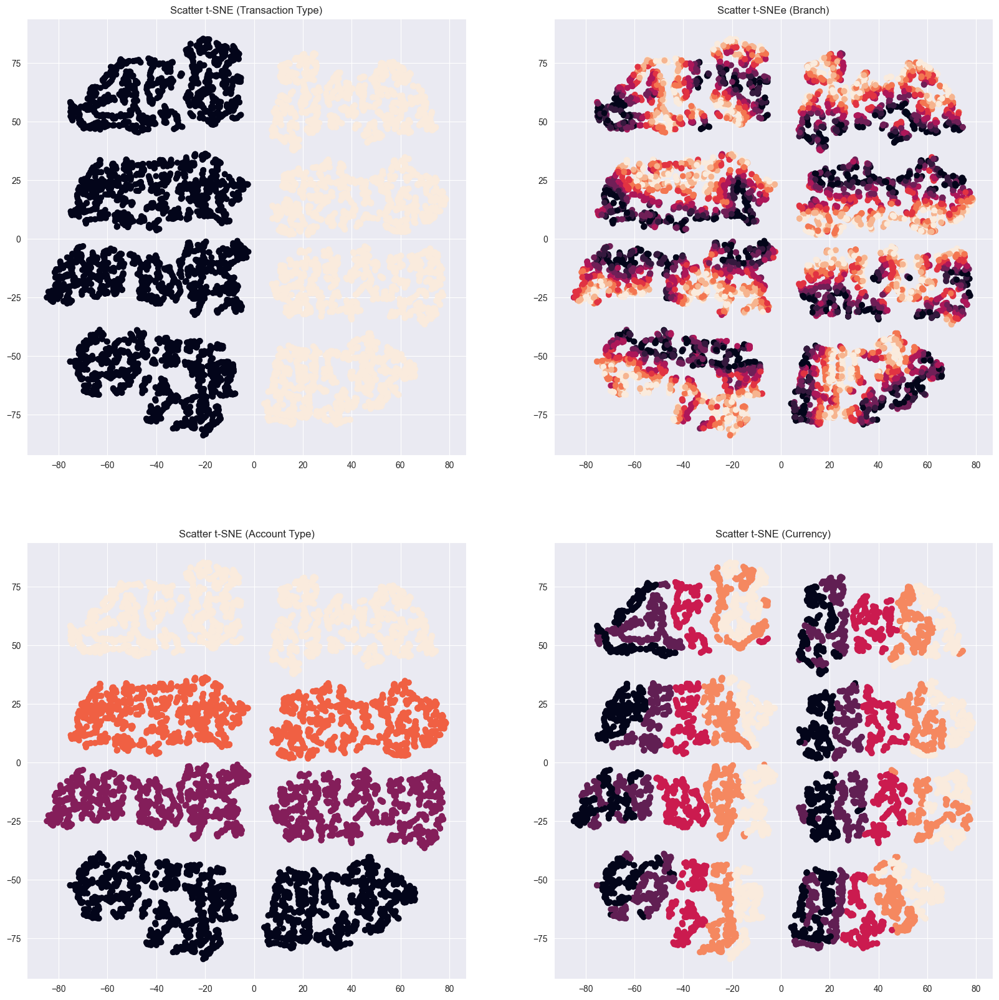

In [113]:
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

axes[0,0].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Transaction Type'])
axes[0,0].set_title('Scatter t-SNE (Transaction Type)')

axes[1,0].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Account Type'])
axes[1,0].set_title('Scatter t-SNE (Account Type)')

axes[0,1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Branch'])
axes[0,1].set_title('Scatter t-SNEe (Branch)')

axes[1,1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], c=df_original['Currency'])
axes[1,1].set_title('Scatter t-SNE (Currency)')

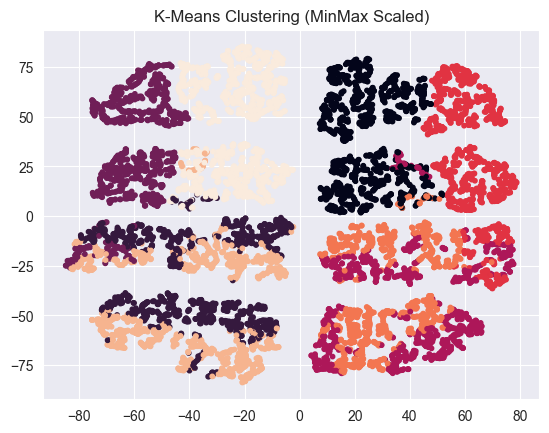

In [114]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=8, random_state=42).fit_predict(X_minmax)

plt.scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=kmeans)
plt.title('K-Means Clustering (MinMax Scaled)')
plt.show()

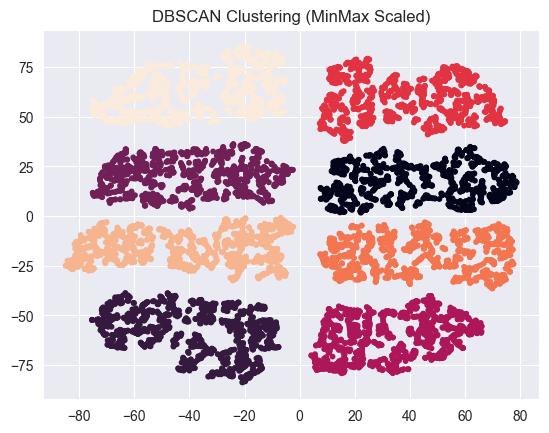

In [116]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.3, min_samples=5).fit_predict(X_minmax)

plt.scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10, c=dbscan)
plt.title('DBSCAN Clustering (MinMax Scaled)')
plt.show()

## Co z PCA?

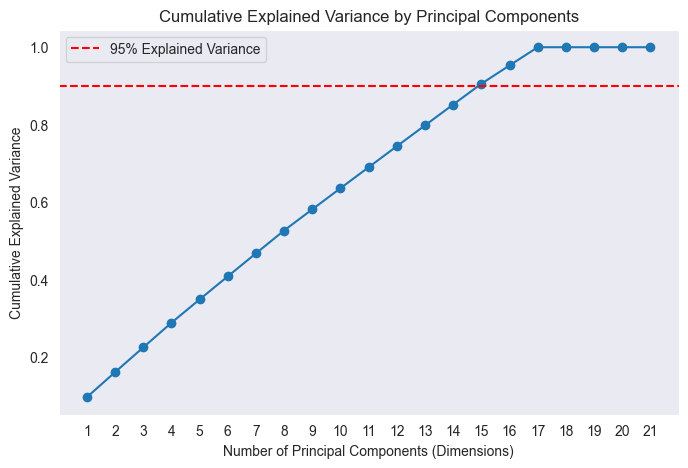

In [117]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df.copy()

X = StandardScaler().fit_transform(X)

pca = PCA()
principal_components = pca.fit_transform(X)

explained_variance = pca.explained_variance_ratio_

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.xlabel('Number of Principal Components (Dimensions)')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid()
plt.axhline(y=0.9, color='r', linestyle='--', label='95% Explained Variance')
plt.legend()
plt.show()

In [118]:
pca = PCA(n_components=15)

x_reduced = pca.fit_transform(StandardScaler().fit_transform(df.copy()))

In [119]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

X = x_reduced.copy()

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

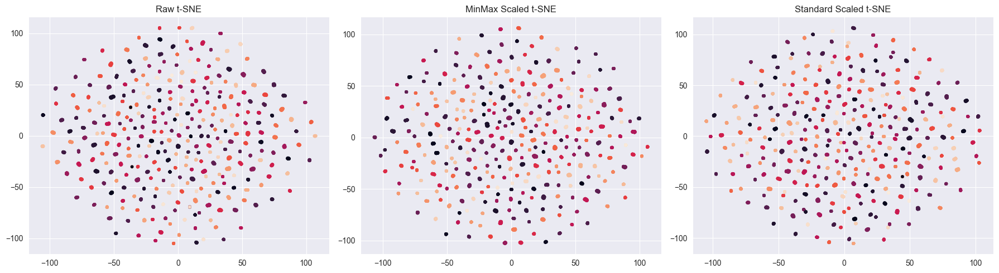

In [120]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X))
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X_minmax))
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X_standard))
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

To samo na danych potraktowanych Label Encoderem

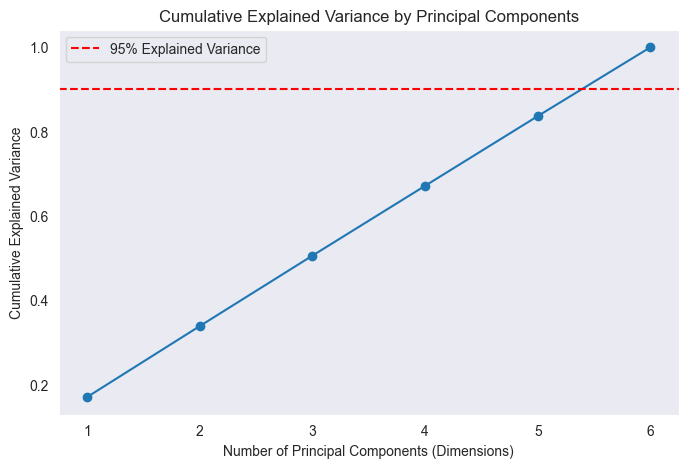

In [121]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df_original.copy()

X = StandardScaler().fit_transform(X)

pca = PCA()
principal_components = pca.fit_transform(X)

explained_variance = pca.explained_variance_ratio_

cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_explained_variance) + 1), cumulative_explained_variance, marker='o', linestyle='-')
plt.xlabel('Number of Principal Components (Dimensions)')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xticks(range(1, len(cumulative_explained_variance) + 1))
plt.grid()
plt.axhline(y=0.9, color='r', linestyle='--', label='95% Explained Variance')
plt.legend()
plt.show()

In [122]:
pca = PCA(n_components=6)

x_reduced = pca.fit_transform(df_original.copy())

In [124]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

X = x_reduced.copy()

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

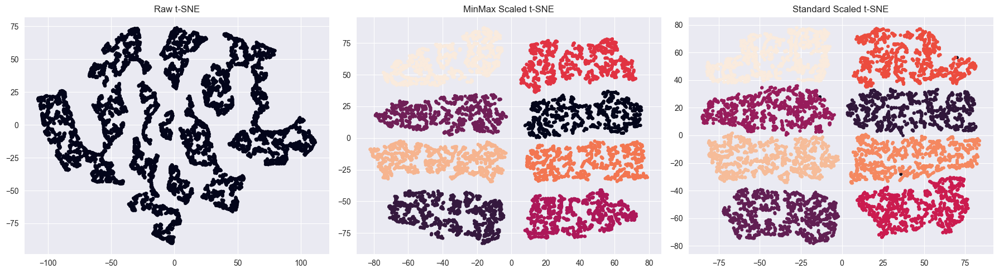

In [125]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10,
                c=DBSCAN(eps=1, min_samples=5).fit_predict(X))
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X_minmax))
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10,
                c=DBSCAN(eps=0.8, min_samples=2).fit_predict(X_standard))
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()

In [126]:
pca = PCA(n_components=6)

x_reduced = pca.fit_transform(df.copy())

In [127]:
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler, StandardScaler

X = x_reduced.copy()

# t-SNE dla nieprzekształconych danych
tsne_raw = TSNE(n_components=2, random_state=42)
X_tsne_raw = tsne_raw.fit_transform(X)

# 2. t-SNE dla danych po normalizacji
X_minmax = MinMaxScaler().fit_transform(X)
X_tsne_minmax = TSNE(n_components=2, random_state=42).fit_transform(X_minmax)

# 3. t-SNE dla danych po standaryzacji
X_standard = StandardScaler().fit_transform(X)
X_tsne_standard = TSNE(n_components=2, random_state=42).fit_transform(X_standard)

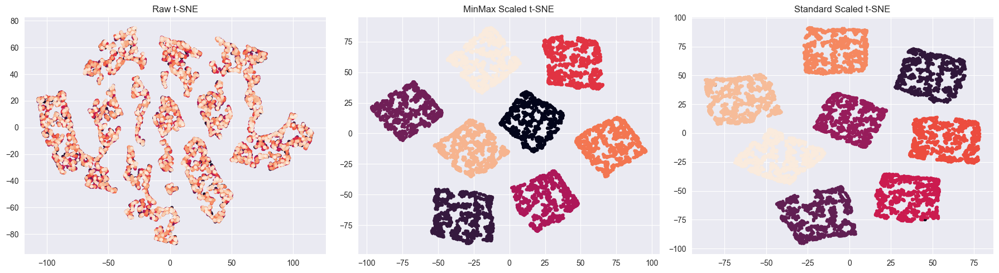

In [128]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(X_tsne_raw[:, 0], X_tsne_raw[:, 1], s=10,
                c=DBSCAN(eps=0.1, min_samples=1).fit_predict(X))
axes[0].set_title('Raw t-SNE')

axes[1].scatter(X_tsne_minmax[:, 0], X_tsne_minmax[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X_minmax))
axes[1].set_title('MinMax Scaled t-SNE')

axes[2].scatter(X_tsne_standard[:, 0], X_tsne_standard[:, 1], s=10,
                c=DBSCAN(eps=0.3, min_samples=5).fit_predict(X_standard))
axes[2].set_title('Standard Scaled t-SNE')

plt.tight_layout()
plt.show()